# 📉 Customer Churn  

## 🔍 What is Customer Churn?  
Customer churn, also known as *customer attrition*, refers to the percentage of customers who stop using a product or service over a given period of time.  

---

## **Why is Customer Churn Important?**  

- **💰 Revenue Loss** – Losing customers directly impacts a company’s revenue.  
- **📉 Market Competition** – A high churn rate suggests dissatisfaction or better alternatives in the market.  
- **🔧 Business Improvement** – Helps companies understand weaknesses and develop strategies to retain customers.  
- **💸 Customer Retention is Cheaper than Acquisition** – Acquiring new customers can cost **5–25x more** than retaining existing ones. Reducing churn improves profitability.  
- **📊 Business Stability & Investor Confidence** – High churn can indicate instability, making investors and stakeholders cautious about long-term growth.  
- **🛠 Predictive Insights** – Analyzing churn helps businesses identify at-risk customers and take proactive measures (discounts, loyalty programs, better customer support).  
- **🎯 Brand Loyalty & Customer Lifetime Value (CLV)** – Lower churn leads to stronger brand loyalty, increased customer satisfaction, and higher CLV.  


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import accuracy_score, roc_auc_score, classification_report, RocCurveDisplay,confusion_matrix
from sklearn.tree import DecisionTreeClassifier
from mlxtend.plotting import plot_confusion_matrix
import plotly.express as px
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings("ignore")

In [2]:
dataset_path = "/Users/sreyashmohanty/.cache/kagglehub/datasets/ankitverma2010/ecommerce-customer-churn-analysis-and-prediction/versions/1"

##  E- COMMERCE DATASET

In [69]:
excel_path = dataset_path + "/E Commerce Dataset.xlsx" 
df = pd.read_excel(excel_path,sheet_name = "E Comm")
df.head()

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,50001,1,4.0,Mobile Phone,3,6.0,Debit Card,Female,3.0,3,Laptop & Accessory,2,Single,9,1,11.0,1.0,1.0,5.0,159.93
1,50002,1,NaN,Phone,1,8.0,UPI,Male,3.0,4,Mobile,3,Single,7,1,15.0,0.0,1.0,0.0,120.90
2,50003,1,NaN,Phone,1,30.0,Debit Card,Male,2.0,4,Mobile,3,Single,6,1,14.0,0.0,1.0,3.0,120.28
3,50004,1,0.0,Phone,3,15.0,Debit Card,Male,2.0,4,Laptop & Accessory,5,Single,8,0,23.0,0.0,1.0,3.0,134.07
4,50005,1,0.0,Phone,1,12.0,CC,Male,NaN,3,Mobile,5,Single,3,0,11.0,1.0,1.0,3.0,129.60


## DATASET DESCRIPTION

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5630 entries, 0 to 5629
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   CustomerID                   5630 non-null   int64  
 1   Churn                        5630 non-null   int64  
 2   Tenure                       5366 non-null   float64
 3   PreferredLoginDevice         5630 non-null   object 
 4   CityTier                     5630 non-null   int64  
 5   WarehouseToHome              5379 non-null   float64
 6   PreferredPaymentMode         5630 non-null   object 
 7   Gender                       5630 non-null   object 
 8   HourSpendOnApp               5375 non-null   float64
 9   NumberOfDeviceRegistered     5630 non-null   int64  
 10  PreferedOrderCat             5630 non-null   object 
 11  SatisfactionScore            5630 non-null   int64  
 12  MaritalStatus                5630 non-null   object 
 13  NumberOfAddress   

## NUMERICAL VS CATEGORICAL ATTRIBUTES

In [6]:
cat_col = []
num_col = []
for i in df.columns:
    if df[i].dtype == 'object':
        cat_col.append(i)
    elif df[i].dtype in ['float64', 'int64']:
        num_col.append(i)

print(f"Total number of numerical columns: {len(num_col)}")
print(f"Total number of categorical columns: {len(cat_col)}")


Total number of numerical columns: 15
Total number of categorical columns: 5


In [7]:
cat_col

['PreferredLoginDevice',
 'PreferredPaymentMode',
 'Gender',
 'PreferedOrderCat',
 'MaritalStatus']

In [8]:
num_col

['CustomerID',
 'Churn',
 'Tenure',
 'CityTier',
 'WarehouseToHome',
 'HourSpendOnApp',
 'NumberOfDeviceRegistered',
 'SatisfactionScore',
 'NumberOfAddress',
 'Complain',
 'OrderAmountHikeFromlastYear',
 'CouponUsed',
 'OrderCount',
 'DaySinceLastOrder',
 'CashbackAmount']

In [9]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
CustomerID,5630.0,52815.500000,1625.385339,50001.0,51408.25,52815.50,54222.7500,55630.00
Churn,5630.0,0.168384,0.374240,0.0,0.00,0.00,0.0000,1.00
Tenure,5366.0,10.189899,8.557241,0.0,2.00,9.00,16.0000,61.00
CityTier,5630.0,1.654707,0.915389,1.0,1.00,1.00,3.0000,3.00
WarehouseToHome,5379.0,15.639896,8.531475,5.0,9.00,14.00,20.0000,127.00
HourSpendOnApp,5375.0,2.931535,0.721926,0.0,2.00,3.00,3.0000,5.00
NumberOfDeviceRegistered,5630.0,3.688988,1.023999,1.0,3.00,4.00,4.0000,6.00
SatisfactionScore,5630.0,3.066785,1.380194,1.0,2.00,3.00,4.0000,5.00
NumberOfAddress,5630.0,4.214032,2.583586,1.0,2.00,3.00,6.0000,22.00
Complain,5630.0,0.284902,0.451408,0.0,0.00,0.00,1.0000,1.00


## CHECKING VALUE RANGE FOR EACH ATTRIBUTE (OUTLIER)

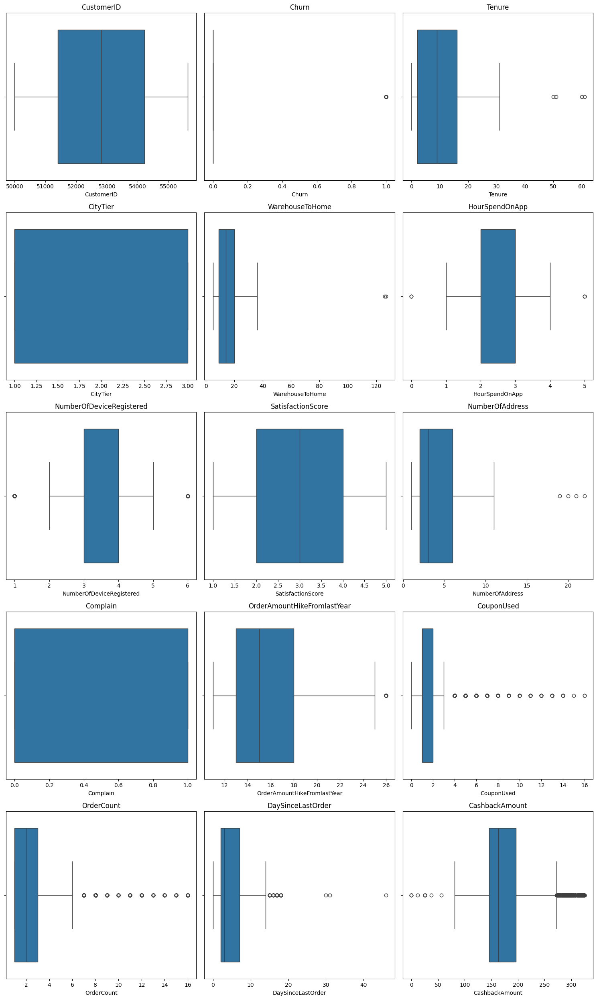

In [10]:

num_cols = [col for col in df.columns if df[col].dtype in ['float64', 'int64']]
num_plots = len(num_cols)
cols = 3 
rows = (num_plots // cols) + (num_plots % cols > 0) 
fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 5))  
axes = axes.flatten() 
for i, col in enumerate(num_cols):
    sns.boxplot(x=df[col], ax=axes[i])
    axes[i].set_title(col)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()




## OUTLIERS IN CASHBACK CAN BE SEEN ,THIS NEEDS TO BE CORRECTED BEFORE TRAINING 

In [11]:
df.duplicated().sum()

0

In [12]:
df.isnull().sum()

CustomerID                       0
Churn                            0
Tenure                         264
PreferredLoginDevice             0
CityTier                         0
WarehouseToHome                251
PreferredPaymentMode             0
Gender                           0
HourSpendOnApp                 255
NumberOfDeviceRegistered         0
PreferedOrderCat                 0
SatisfactionScore                0
MaritalStatus                    0
NumberOfAddress                  0
Complain                         0
OrderAmountHikeFromlastYear    265
CouponUsed                     256
OrderCount                     258
DaySinceLastOrder              307
CashbackAmount                   0
dtype: int64

## PERCENTAGE OF MISSING DATA

In [13]:
for i in df.columns:
    if df[i].isnull().sum()>0:
        null_per=(df[i].isnull().sum())/(len(df[i]))*100
        print(f"{i} Miss percentage:{null_per:.2f}%")

Tenure Miss percentage:4.69%
WarehouseToHome Miss percentage:4.46%
HourSpendOnApp Miss percentage:4.53%
OrderAmountHikeFromlastYear Miss percentage:4.71%
CouponUsed Miss percentage:4.55%
OrderCount Miss percentage:4.58%
DaySinceLastOrder Miss percentage:5.45%


In [14]:
for i in cat_col:
    print(f"{i} has {df[i].nunique()} labels")
    

PreferredLoginDevice has 3 labels
PreferredPaymentMode has 7 labels
Gender has 2 labels
PreferedOrderCat has 6 labels
MaritalStatus has 3 labels


# DATA EXPLORATION

### CHURN PERCENTAGE

In [84]:
churn_counts = df.Churn.value_counts()
churn_percentage = (churn_counts[1] / churn_counts.sum()) * 100
print(churn_percentage)


16.838365896980463


## PLOTS OF DIFFERENT ATTRIBUTES

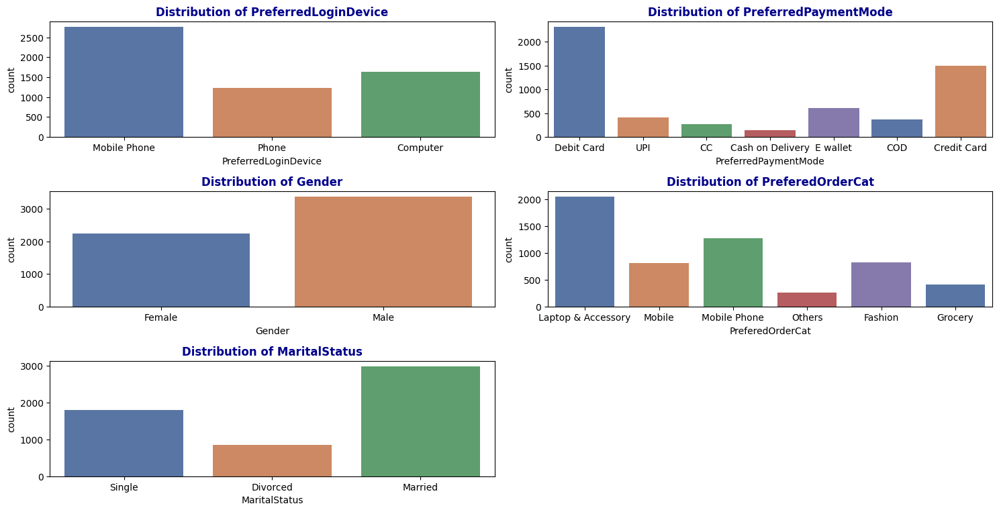

In [18]:
plt.figure(figsize=(15, 25))
plot_num = 1
color_palette = sns.color_palette("deep", len(cat_col))
for i, col in enumerate(cat_col):
    plt.subplot(10, 2, plot_num)
    sns.countplot(data=df, x=col, palette=color_palette) 
    plt.title(f"Distribution of {col}", fontsize=12, fontweight='bold', color="darkblue") 
    plot_num += 1

plt.tight_layout()
plt.show()

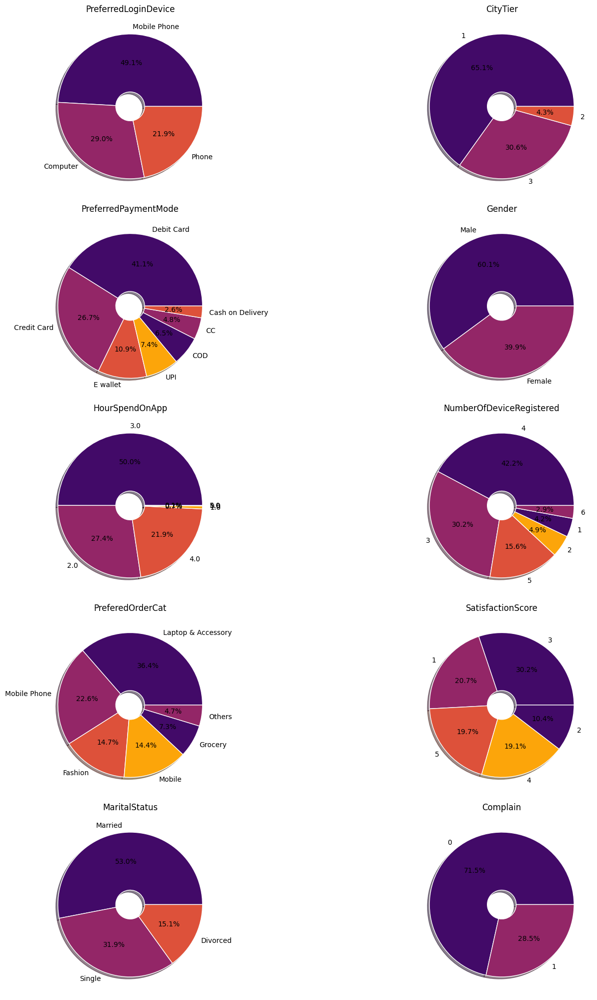

In [21]:
plt.figure(figsize=(15,40))
plot_num = 1
for col in df.columns:
    if df[col].nunique() <= 8 and col!="Churn":
        plt.subplot(10,2,plot_num)
        plt.pie(data=df, x=df[col].value_counts().values,labels=df[col].value_counts().index,shadow=True,autopct='%1.1f%%',
               colors = sns.color_palette("inferno", 4)

,wedgeprops=dict(width=0.8,edgecolor="w") )
        plt.title(col)
        plot_num += 1
        plt.tight_layout()

## RELATION WRT CHURN

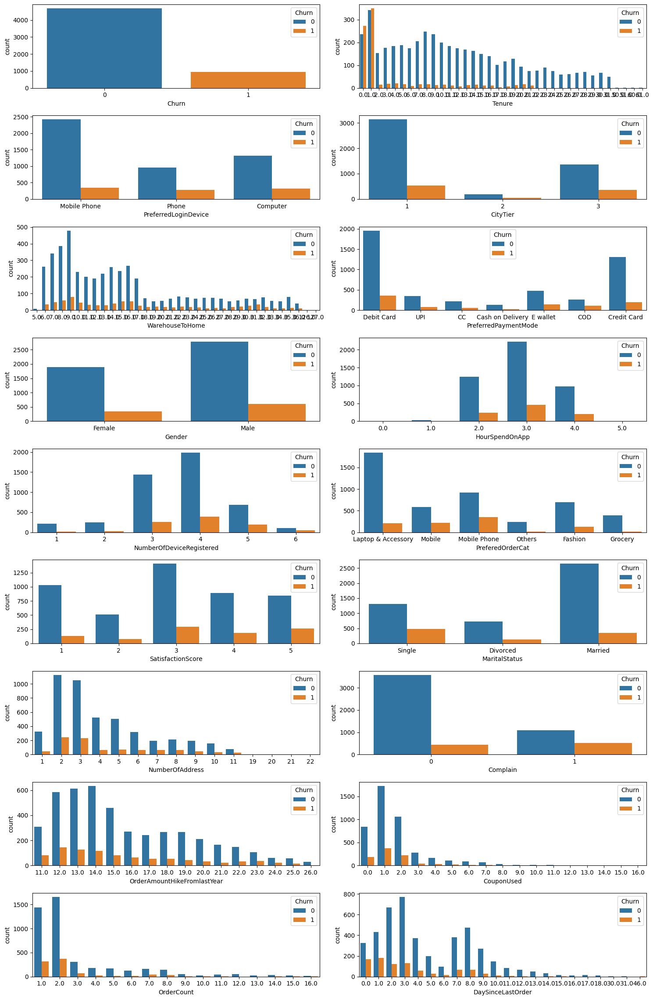

In [23]:
plt.figure(figsize=(15,25))
plot_num = 1
for col in df.columns:
    if col!="CustomerID" and col!="CashbackAmount":
            plt.subplot(10,2,plot_num)
            sns.countplot(data=df, x=col,hue='Churn')
            plot_num += 1
            plt.tight_layout()

# SOME KEY TAKEAWAYS
- CUSTOMERS WHO COMPLAIN ARE LIKELY TO CHURN
- CUSTOMERS WHO GAVE A SATISFACTION RATING OF 3 ARE MORE LIKELY TO CHURN
- USERS HAVING 3-4 DEVICES FALL UNDER THE CHURN CATEGORY
- MALE CUSTOMERS CHURN MORE THAN FEMALE CUSTOMERS
- PEOPLE WHO ARE SINGLE CHURN MORE
- LESSER THE TENTURE MORE IS THE CHURN

## CORRELATION MATRIX
- TO IDENTIFY HIGLY CORRELATED VALUES WITH CHURN AND BETWEEN EACH OTHER

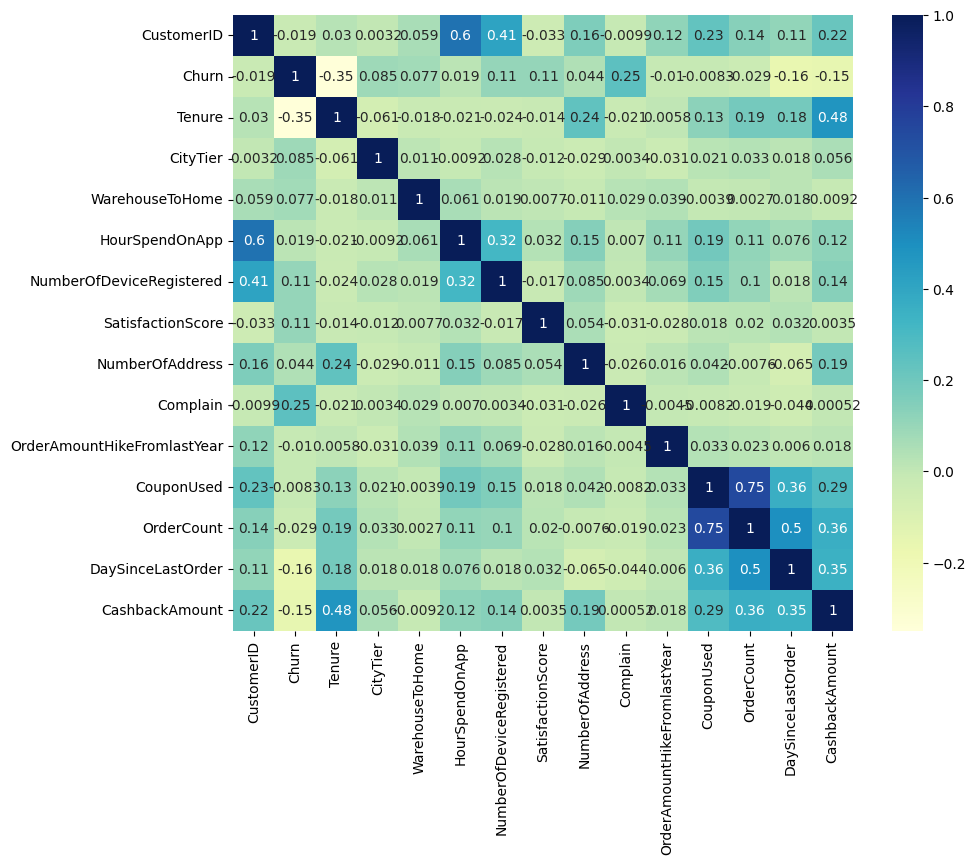

In [24]:
numeric_df = df.select_dtypes(include=['number'])  
fig = plt.figure(figsize=(10, 8
                         ))
sns.heatmap(numeric_df.corr(), cmap="YlGnBu", annot=True)
plt.show()

### COUPON USED HAS HIGH CORRELATION WITH TENTURE WHICH HAVE VERY LESS CORRELATION WITH CHURN

In [25]:
df=df.drop(['CouponUsed', 'Tenure','CustomerID'], axis=1)

In [26]:
len(df.columns)

17

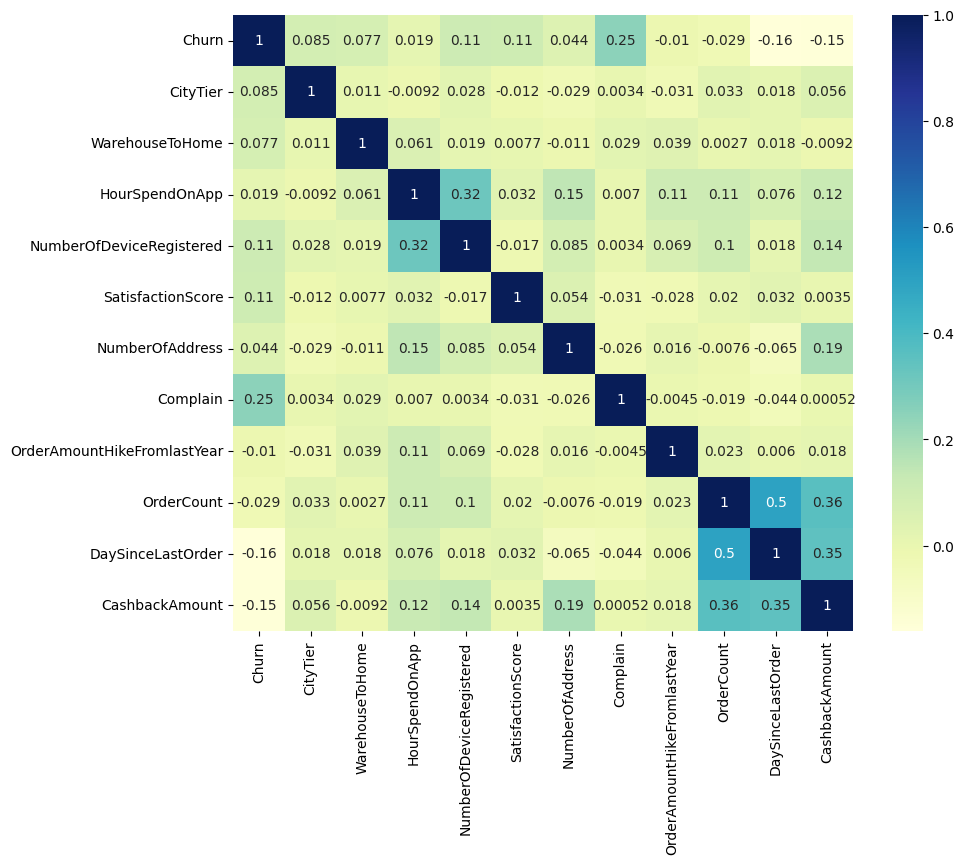

In [27]:
numeric_df = df.select_dtypes(include=['number'])  
fig = plt.figure(figsize=(10, 8
                         ))
sns.heatmap(numeric_df.corr(), cmap="YlGnBu", annot=True)
plt.show()

## TABLE AFTER DROP

In [28]:
df.head()

,Churn,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,OrderCount,DaySinceLastOrder,CashbackAmount
0,1,Mobile Phone,3,6.0,Debit Card,Female,3.0,3,Laptop & Accessory,2,Single,9,1,11.0,1.0,5.0,159.93
1,1,Phone,1,8.0,UPI,Male,3.0,4,Mobile,3,Single,7,1,15.0,1.0,0.0,120.90
2,1,Phone,1,30.0,Debit Card,Male,2.0,4,Mobile,3,Single,6,1,14.0,1.0,3.0,120.28
3,1,Phone,3,15.0,Debit Card,Male,2.0,4,Laptop & Accessory,5,Single,8,0,23.0,1.0,3.0,134.07
4,1,Phone,1,12.0,CC,Male,NaN,3,Mobile,5,Single,3,0,11.0,1.0,3.0,129.60


In [29]:
df.shape

(5630, 17)

In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5630 entries, 0 to 5629
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Churn                        5630 non-null   int64  
 1   PreferredLoginDevice         5630 non-null   object 
 2   CityTier                     5630 non-null   int64  
 3   WarehouseToHome              5379 non-null   float64
 4   PreferredPaymentMode         5630 non-null   object 
 5   Gender                       5630 non-null   object 
 6   HourSpendOnApp               5375 non-null   float64
 7   NumberOfDeviceRegistered     5630 non-null   int64  
 8   PreferedOrderCat             5630 non-null   object 
 9   SatisfactionScore            5630 non-null   int64  
 10  MaritalStatus                5630 non-null   object 
 11  NumberOfAddress              5630 non-null   int64  
 12  Complain                     5630 non-null   int64  
 13  OrderAmountHikeFro

## REMOVING ATTRIBUTES HAVING NULL VALUES

In [31]:
to_be_del=[]
for i in df.columns:
    if df[i].isnull().sum()>0:
        to_be_del.append(i)

In [32]:
df.drop(to_be_del, axis=1, inplace=True)

In [33]:
df.head()

,Churn,PreferredLoginDevice,CityTier,PreferredPaymentMode,Gender,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,CashbackAmount
0,1,Mobile Phone,3,Debit Card,Female,3,Laptop & Accessory,2,Single,9,1,159.93
1,1,Phone,1,UPI,Male,4,Mobile,3,Single,7,1,120.90
2,1,Phone,1,Debit Card,Male,4,Mobile,3,Single,6,1,120.28
3,1,Phone,3,Debit Card,Male,4,Laptop & Accessory,5,Single,8,0,134.07
4,1,Phone,1,CC,Male,3,Mobile,5,Single,3,0,129.60


In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5630 entries, 0 to 5629
Data columns (total 12 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Churn                     5630 non-null   int64  
 1   PreferredLoginDevice      5630 non-null   object 
 2   CityTier                  5630 non-null   int64  
 3   PreferredPaymentMode      5630 non-null   object 
 4   Gender                    5630 non-null   object 
 5   NumberOfDeviceRegistered  5630 non-null   int64  
 6   PreferedOrderCat          5630 non-null   object 
 7   SatisfactionScore         5630 non-null   int64  
 8   MaritalStatus             5630 non-null   object 
 9   NumberOfAddress           5630 non-null   int64  
 10  Complain                  5630 non-null   int64  
 11  CashbackAmount            5630 non-null   float64
dtypes: float64(1), int64(6), object(5)
memory usage: 527.9+ KB


## OUTLIER REMOVAL USING IQT

In [35]:
from numpy import percentile

q25 = percentile(df['CashbackAmount'], 25)
q75 = percentile(df['CashbackAmount'], 75)

iqr = q75 - q25

cutoff = 1.5 * iqr
lower = q25 - cutoff
upper = q75 + cutoff

print('The Number of Above Upper Limits:', len(df[df['CashbackAmount'] > upper]))
print('The Number of Below Lower Limits:', len(df[df['CashbackAmount'] < lower]))

median = np.median(df['CashbackAmount'])

df.loc[df['CashbackAmount'] > upper, 'CashbackAmount'] = median
df.loc[df['CashbackAmount'] < lower, 'CashbackAmount'] = median



The Number of Above Upper Limits: 427
The Number of Below Lower Limits: 11


In [36]:
df['Churn'] = df['Churn'].astype('object')

In [37]:
col_store=df.columns
col_store

Index(['Churn', 'PreferredLoginDevice', 'CityTier', 'PreferredPaymentMode',
       'Gender', 'NumberOfDeviceRegistered', 'PreferedOrderCat',
       'SatisfactionScore', 'MaritalStatus', 'NumberOfAddress', 'Complain',
       'CashbackAmount'],
      dtype='object')

## DATA STANDARDIZATION

In [38]:
num_columns = df.select_dtypes(include=['float', 'int']).columns
df[num_columns] = StandardScaler().fit_transform(df[num_columns])

In [39]:
df_new=pd.DataFrame(data=df,columns=col_store)

In [40]:
df_new.head()

,Churn,PreferredLoginDevice,CityTier,PreferredPaymentMode,Gender,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,CashbackAmount
0,1,Mobile Phone,1.469771,Debit Card,Female,-0.67290,Laptop & Accessory,-0.772992,Single,1.852616,1.584290,-0.215238
1,1,Phone,-0.715286,UPI,Male,0.30375,Mobile,-0.048392,Single,1.078430,1.584290,-1.365025
2,1,Phone,-0.715286,Debit Card,Male,0.30375,Mobile,-0.048392,Single,0.691336,1.584290,-1.383290
3,1,Phone,1.469771,Debit Card,Male,0.30375,Laptop & Accessory,1.400807,Single,1.465523,-0.631198,-0.977049
4,1,Phone,-0.715286,CC,Male,-0.67290,Mobile,1.400807,Single,-0.469944,-0.631198,-1.108731


In [41]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5630 entries, 0 to 5629
Data columns (total 12 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Churn                     5630 non-null   object 
 1   PreferredLoginDevice      5630 non-null   object 
 2   CityTier                  5630 non-null   float64
 3   PreferredPaymentMode      5630 non-null   object 
 4   Gender                    5630 non-null   object 
 5   NumberOfDeviceRegistered  5630 non-null   float64
 6   PreferedOrderCat          5630 non-null   object 
 7   SatisfactionScore         5630 non-null   float64
 8   MaritalStatus             5630 non-null   object 
 9   NumberOfAddress           5630 non-null   float64
 10  Complain                  5630 non-null   float64
 11  CashbackAmount            5630 non-null   float64
dtypes: float64(6), object(6)
memory usage: 527.9+ KB


In [42]:
le = LabelEncoder()
df_new['Churn'] = le.fit_transform(df_new['Churn'])
df_new['Gender'] = le.fit_transform(df_new['Gender'])

In [43]:
df_new.head()

,Churn,PreferredLoginDevice,CityTier,PreferredPaymentMode,Gender,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,CashbackAmount
0,1,Mobile Phone,1.469771,Debit Card,0,-0.67290,Laptop & Accessory,-0.772992,Single,1.852616,1.584290,-0.215238
1,1,Phone,-0.715286,UPI,1,0.30375,Mobile,-0.048392,Single,1.078430,1.584290,-1.365025
2,1,Phone,-0.715286,Debit Card,1,0.30375,Mobile,-0.048392,Single,0.691336,1.584290,-1.383290
3,1,Phone,1.469771,Debit Card,1,0.30375,Laptop & Accessory,1.400807,Single,1.465523,-0.631198,-0.977049
4,1,Phone,-0.715286,CC,1,-0.67290,Mobile,1.400807,Single,-0.469944,-0.631198,-1.108731


# CREATING A NEW ATTRIBUTE FOR EVERY CLASSIFICATION FOR CAT DATA USING DUMMY

In [44]:
df_new = pd.get_dummies(df_new)

In [45]:
bool_cols = df_new.select_dtypes(include='bool').columns 
df_new[bool_cols] = df_new[bool_cols].astype(int)

In [46]:
df_new.head()

,Churn,CityTier,Gender,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,CashbackAmount,PreferredLoginDevice_Computer,PreferredLoginDevice_Mobile Phone,...,PreferredPaymentMode_UPI,PreferedOrderCat_Fashion,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single
0,1,1.469771,0,-0.67290,-0.772992,1.852616,1.584290,-0.215238,0,1,...,0,0,0,1,0,0,0,0,0,1
1,1,-0.715286,1,0.30375,-0.048392,1.078430,1.584290,-1.365025,0,0,...,1,0,0,0,1,0,0,0,0,1
2,1,-0.715286,1,0.30375,-0.048392,0.691336,1.584290,-1.383290,0,0,...,0,0,0,0,1,0,0,0,0,1
3,1,1.469771,1,0.30375,1.400807,1.465523,-0.631198,-0.977049,0,0,...,0,0,0,1,0,0,0,0,0,1
4,1,-0.715286,1,-0.67290,1.400807,-0.469944,-0.631198,-1.108731,0,0,...,0,0,0,0,1,0,0,0,0,1


In [47]:
X = df_new.drop('Churn', axis=1)
y = df_new['Churn']

In [48]:
print(X.shape,y.shape)

(5630, 26) (5630,)


## DATA SPLIT INTO TRAIN AND TEST

In [49]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, stratify = y, random_state = 42)

In [50]:
from imblearn.over_sampling import SMOTE
X_train, y_train= SMOTE().fit_resample(X_train, y_train)

# CHOOSING THE RIGHT MODEL

In [53]:
log_MOD= LogisticRegression()
svm_MOD = SVC()
dt_MOD= DecisionTreeClassifier()
rf_MOD= RandomForestClassifier()

## TESTING EACH MODEL

In [55]:
mod_list = [log_MOD ,svm_MOD, dt_MOD, rf_MOD]
mod_name_list = ['Logistic Regression', 'Support Vector Machine', 'Decision Tree', 'Random Forest']

# Train all models
for model in mod_list:
    model.fit(X_train, y_train)

train_acc_list = []
test_acc_list = []

for model,name in zip(mod_list, mod_name_list):
    y_pred_train = model.predict(X_train)
    y_pred_test =model.predict(X_test)

    print(f'Using model: {name}')
    print(f'Accuracy Train: {accuracy_score(y_train, y_pred_train)}')
    print(f'Accuracy Test: {accuracy_score(y_test, y_pred_test)}')
    #storing the scores
    train_acc_list.append(accuracy_score(y_train, y_pred_train))
    test_acc_list.append(accuracy_score(y_test, y_pred_test))

    print('-' * 40)
    print('*' * 40)
    print('- ' * 40)


Using model: Logistic Regression
Accuracy Train: 0.8246129204484783
Accuracy Test: 0.8037300177619894
----------------------------------------
****************************************
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
Using model: Support Vector Machine
Accuracy Train: 0.9307261078483716
Accuracy Test: 0.8730017761989343
----------------------------------------
****************************************
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
Using model: Decision Tree
Accuracy Train: 1.0
Accuracy Test: 0.9094138543516874
----------------------------------------
****************************************
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
Using model: Random Forest
Accuracy Train: 1.0
Accuracy Test: 0.9440497335701599
----------------------------------------
****************************************
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 

In [57]:
all_models = pd.DataFrame({
    'Model': mod_name_list,
    'Test_Accuracy': test_acc_list
})
all_models

,Model,Test_Accuracy
0,Logistic Regression,0.803730
1,Support Vector Machine,0.873002
2,Decision Tree,0.909414
3,Random Forest,0.944050


In [58]:
fig = px.bar(
    all_models, 
    x='Test_Accuracy', 
    y='Model', 
    color='Test_Accuracy',
    title="<b>Models Vs Test Accuracies",
    text_auto=True,
    color_continuous_scale='Blues'
)

fig.update_layout(
    hovermode='x',
    title_font_size=30,
    title_font_color="black",
    template="plotly",
    hoverlabel_font_size=20,
    title_x=0.5,
    xaxis_title='Test Accuracy',
    yaxis_title='Model Names'
)

fig.show()

# evaluating for decision trees

In [59]:
model = DecisionTreeClassifier()
model.fit(X_train, y_train)

DecisionTreeClassifier()

In [60]:
y_pred = model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
roc_auc3 = roc_auc_score(y_test, y_pred)

print("Accuracy = {:.5f}".format(accuracy))
print("ROC Area under Curve = {:.5f}".format(roc_auc3))
print(classification_report(y_test, y_pred, digits=5))

Accuracy = 0.91119
ROC Area under Curve = 0.86478
              precision    recall  f1-score   support

           0    0.95733   0.93483   0.94595       936
           1    0.71226   0.79474   0.75124       190

    accuracy                        0.91119      1126
   macro avg    0.83480   0.86478   0.84859      1126
weighted avg    0.91598   0.91119   0.91309      1126



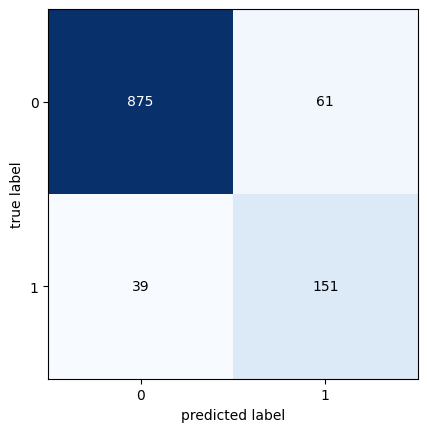

In [61]:
# Plot Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
plot_confusion_matrix(cm)
plt.show()  

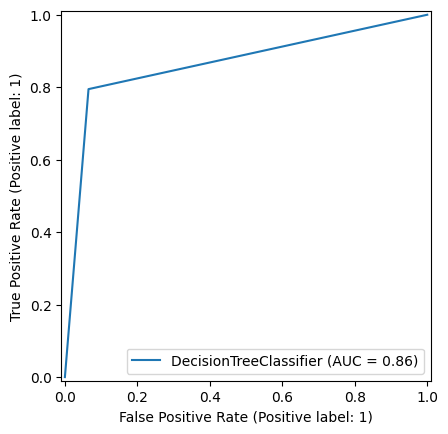

In [62]:
RocCurveDisplay.from_estimator(model, X_test, y_test)
plt.show()

## SUMMARY 

## we can see model best performs on random forest model with accuracy of 94.4 % on the test data